# Sommaire :

<a href="#A1">**Partie 1 : Introduction**</a>

<a href="#A2">**Partie 2 : Nettoyage**</a>
 - <a href="#C3">2-1 : Suppression des colonnes vides</a>
 - <a href="#C4">2-2 : Suppression des lignes en doublons</a>
 - <a href="#C5">2-3 : Réduction de la base aux bâtiments non destinés à l’habitation</a>
 - <a href="#C6">2-4 : Vérification des types</a>
 - <a href="#C7">2-5 : Suppression des outliers</a>
 - <a href="#C71">2-6 : nettoyage des étiquettes</a>
 - <a href="#C72">2-7 : Suppression de la colonne 'Outlier'</a>
    
<a href="#A3">**Partie 3 : Exploration**</a>
 - <a href="#C8">3-1 : Analyse Univariée et bivariée</a>
 - <a href="#C9">3-2 : Feature Engineering - Variables numériques</a>
 - <a href="#C10">3-3 : Feature Engineering - Variables catégorielles</a>
 - <a href="#C11">Annexes</a>

# <a name="A1">Partie 1 : Introduction</a>

In [1]:
#général
import numpy as np
import pandas as pd

#visualisation
from matplotlib import pyplot as plt
import seaborn as sns
import missingno as msno
import folium
import folium.plugins

#feature engineering
from category_encoders import TargetEncoder

In [2]:
#conversion de la base en pd.DataFrame
df=pd.read_csv('2016_Building_Energy_Benchmarking.csv')
df.T

,0,1,2,3,4,5,6,7,8,9,...,3366,3367,3368,3369,3370,3371,3372,3373,3374,3375
OSEBuildingID,1,2,3,5,8,9,10,11,12,13,...,50210,50212,50219,50220,50221,50222,50223,50224,50225,50226
DataYear,2016,2016,2016,2016,2016,2016,2016,2016,2016,2016,...,2016,2016,2016,2016,2016,2016,2016,2016,2016,2016
BuildingType,NonResidential,NonResidential,NonResidential,NonResidential,NonResidential,Nonresidential COS,NonResidential,NonResidential,NonResidential,Multifamily MR (5-9),...,Nonresidential COS,Nonresidential COS,Nonresidential COS,Nonresidential COS,Nonresidential COS,Nonresidential COS,Nonresidential COS,Nonresidential COS,Nonresidential COS,Nonresidential COS
PrimaryPropertyType,Hotel,Hotel,Hotel,Hotel,Hotel,Other,Hotel,Other,Hotel,Mid-Rise Multifamily,...,Office,Other,Mixed Use Property,Office,Other,Office,Other,Other,Mixed Use Property,Mixed Use Property
PropertyName,Mayflower park hotel,Paramount Hotel,5673-The Westin Seattle,HOTEL MAX,WARWICK SEATTLE HOTEL (ID8),West Precinct,Camlin,Paramount Theatre,311wh-Pioneer Square,Lyon Building,...,Central West HQ / Brown Bear,Conservatory Campus,Garfield Community Center,Genesee/SC SE HQ,High Point Community Center,Horticulture building,International district/Chinatown CC,Queen Anne Pool,South Park Community Center,Van Asselt Community Center
Address,405 Olive way,724 Pine street,1900 5th Avenue,620 STEWART ST,401 LENORA ST,810 Virginia St,1619 9th Avenue,911 Pine St,612 2nd Ave,607 - 3rd Ave.,...,1403 w howe,1400 E Galer St,2323 East Cherry St,4420 S Genesee,6920 34th Ave SW,1600 S Dakota St,719 8th Ave S,1920 1st Ave W,8319 8th Ave S,2820 S Myrtle St
City,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,...,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle,Seattle
State,WA,WA,WA,WA,WA,WA,WA,WA,WA,WA,...,WA,WA,WA,WA,WA,WA,WA,WA,WA,WA
ZipCode,98101.0,98101.0,98101.0,98101.0,98121.0,98101.0,98101.0,98101.0,98104.0,98104.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TaxParcelIdentificationNumber,0659000030,0659000220,0659000475,0659000640,0659000970,0660000560,0660000825,0660000955,0939000080,0939000105,...,2425039137,2925049087,7544800245,4154300585,2524039059,1624049080,3558300000,1794501150,7883603155,7857002030


In [3]:
#Description de la base
df.describe().T

,count,mean,std,min,25%,50%,75%,max
OSEBuildingID,3376.0,2.120899e+04,1.222376e+04,1.00000,19990.750000,2.311200e+04,2.599425e+04,5.022600e+04
DataYear,3376.0,2.016000e+03,0.000000e+00,2016.00000,2016.000000,2.016000e+03,2.016000e+03,2.016000e+03
ZipCode,3360.0,9.811695e+04,1.861520e+01,98006.00000,98105.000000,9.811500e+04,9.812200e+04,9.827200e+04
CouncilDistrictCode,3376.0,4.439277e+00,2.120625e+00,1.00000,3.000000,4.000000e+00,7.000000e+00,7.000000e+00
Latitude,3376.0,4.762403e+01,4.775842e-02,47.49917,47.599860,4.761867e+01,4.765712e+01,4.773387e+01
Longitude,3376.0,-1.223348e+02,2.720329e-02,-122.41425,-122.350662,-1.223325e+02,-1.223194e+02,-1.222210e+02
YearBuilt,3376.0,1.968573e+03,3.308816e+01,1900.00000,1948.000000,1.975000e+03,1.997000e+03,2.015000e+03
NumberofBuildings,3368.0,1.106888e+00,2.108402e+00,0.00000,1.000000,1.000000e+00,1.000000e+00,1.110000e+02
NumberofFloors,3376.0,4.709123e+00,5.494465e+00,0.00000,2.000000,4.000000e+00,5.000000e+00,9.900000e+01
PropertyGFATotal,3376.0,9.483354e+04,2.188376e+05,11285.00000,28487.000000,4.417500e+04,9.099200e+04,9.320156e+06


In [4]:
#Description de la base
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

<AxesSubplot: >

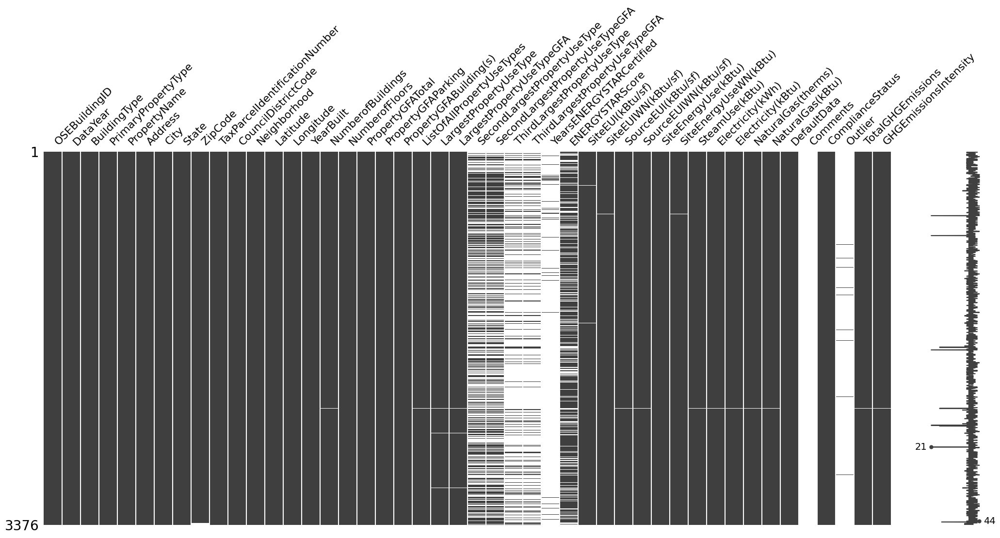

In [5]:
#Visualisation des cellules vides
msno.matrix(df)

<AxesSubplot: >

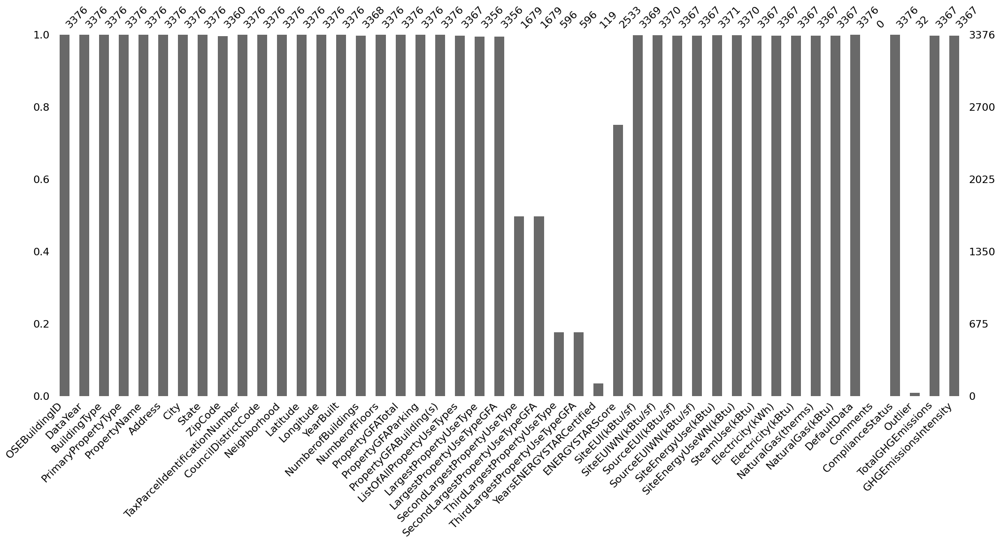

In [6]:
#Visualisation des cellules vides
msno.bar(df)

In [7]:
#Visualisation géographique des bâtiments
seattle_map = folium.Map(location=[47.6062, -122.3321], zoom_start=11)

marker_cluster = folium.plugins.MarkerCluster().add_to(seattle_map)
for lat, lng, in zip(df.Latitude, df.Longitude):
    folium.Marker(location=[lat, lng]).add_to(marker_cluster)
seattle_map

# <a name="A2">**Partie 2 : Nettoyage du jeu de données**</a>

## <a name="C3">2-1 : Suppression des colonnes vides</a>

In [8]:
df21=df.dropna(axis=1,how='all')

## <a name="C4">2-2 : Suppression des lignes en doublons</a>

In [9]:
df21.duplicated().sum()

0

In [10]:
#Traitement sur les colonnes ‘Latitude’ et ‘Longitude’ en doublon
df22=df21.loc[df21.duplicated(subset=['Latitude','Longitude'],keep='first')==False,:]

## <a name="C5">2-3 : Réduction de la base aux bâtiments non destinés à l’habitation</a>

In [11]:
#On se concentre sur la colonne 'BuildingType'
df22['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

In [12]:
#On supprime toutes les valeurs contenatn le mot 'family'
df23=df22.loc[~df21['BuildingType'].str.contains('family'),:]

## <a name="C6">2-4 : Vérification des types</a>

In [13]:
#ZipCode est en float64. On change le type en objet
df24=df23.copy()
df24['ZipCode']=df24['ZipCode'].astype('object')

## <a name="C7">2-5 : Suppression des outliers</a>

In [14]:
df25=df24.copy()

In [15]:
df25.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'ComplianceStatus', 'Outlier',
       'TotalGHG

In [16]:
#Par curiosité on regarde combien de cellules sont considérés comme outlier dans la colonne 'Outlier'
df25['Outlier'].notna().sum()

16

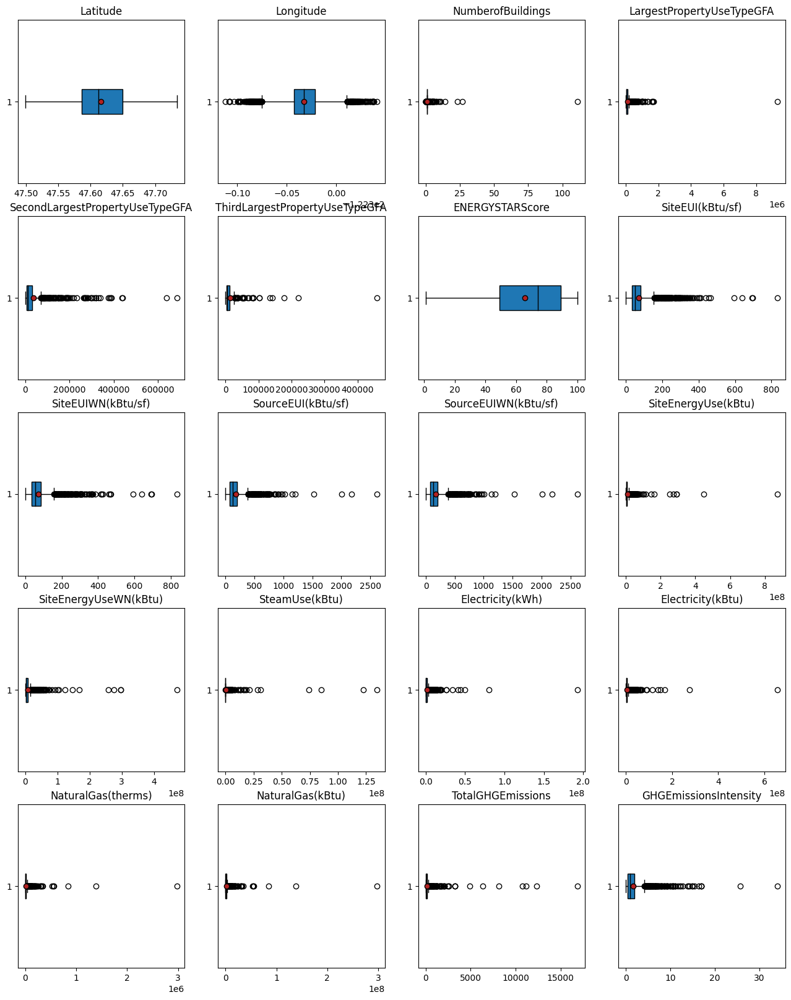

In [17]:
#Visulaisation de boxplots AVANT suppression des outliers
data_X=df25.select_dtypes(include='float64')

fig = plt.figure(figsize=(16, 24))

medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
liste=[]
titres=[]
    
for feat_idx in range(0,data_X.columns.size):
    ax = fig.add_subplot(6,4, (feat_idx+1))

    data=data_X.loc[(data_X.iloc[:,feat_idx]==data_X.iloc[:,feat_idx]),:]
    data=data.iloc[:,feat_idx]
    liste.append(data)
    titres.append(feat_idx)

    h=plt.boxplot(data, showfliers=True, medianprops=medianprops, 
                vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
    plt.title(data_X.columns[feat_idx])

In [18]:
#Fonction de suppression des outliers par la méthode interquartile
def remove_outlier_IQR(df):
    Q1=df.quantile(0.25)
    Q3=df.quantile(0.75)
    IQR=Q3-Q1
    df_final=df[~((df<(Q1-1.5*IQR)) | (df>(Q3+1.5*IQR)))]
    return df_final

In [19]:
#Suppression des outliers
for i in df25.select_dtypes(include='float64').columns :
    df25[i]=remove_outlier_IQR(df25[i])

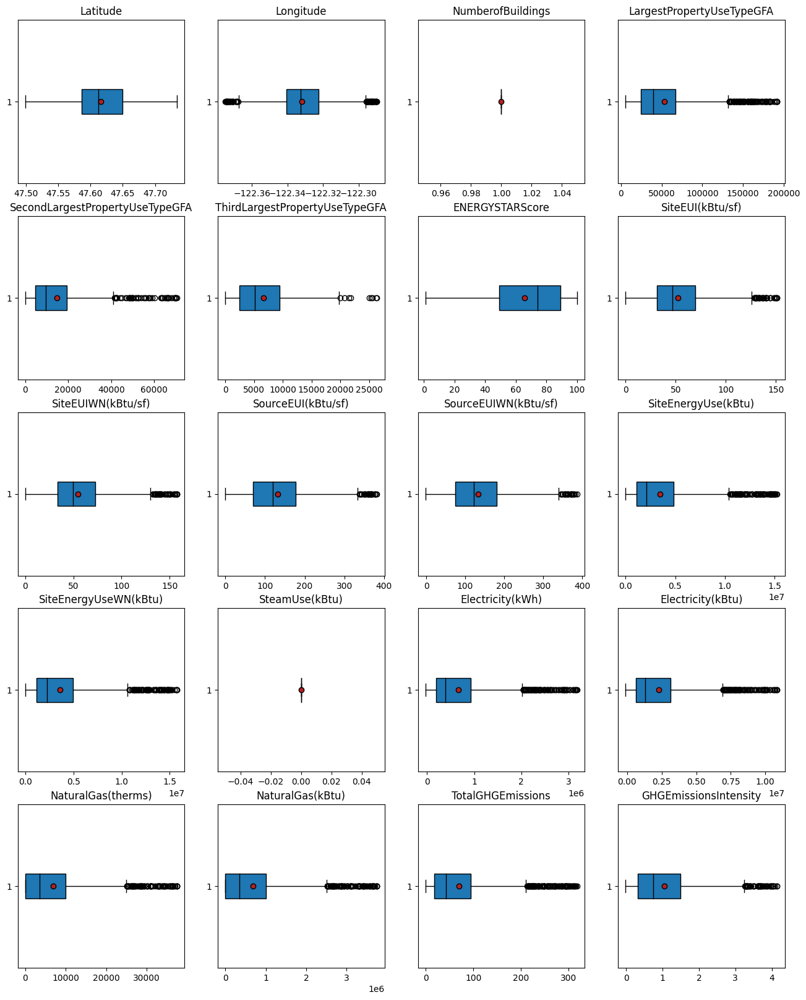

In [20]:
#Visualisation de boxplots APRES suppression des outliers
data_X=df25.select_dtypes(include='float64')

fig = plt.figure(figsize=(16, 24))

medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
liste=[]
titres=[]
    
for feat_idx in range(0,data_X.columns.size):
    ax = fig.add_subplot(6,4, (feat_idx+1))

    data=data_X.loc[(data_X.iloc[:,feat_idx]==data_X.iloc[:,feat_idx]),:]
    data=data.iloc[:,feat_idx]
    liste.append(data)
    titres.append(feat_idx)

    h=plt.boxplot(data, showfliers=True, medianprops=medianprops, 
                vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
    plt.title(data_X.columns[feat_idx])

In [21]:
#On remarque que la colonne Outlier n'est toujours pas vide à cette étape du nettoyage - on revérifiera plus tard
df25['Outlier'].notna().sum()

16

## <a name="C71">2-6 : nettoyage des étiquettes</a>

In [22]:
#Vérification des étiquettes des variables catégorielles
for i in df25.select_dtypes(include=[object]).columns :
    print(i,' : ', df25[i].unique(),'\n')

BuildingType  :  ['NonResidential' 'Nonresidential COS' 'SPS-District K-12' 'Campus'
 'Nonresidential WA'] 

PrimaryPropertyType  :  ['Hotel' 'Other' 'Mixed Use Property' 'K-12 School' 'University'
 'Small- and Mid-Sized Office' 'Self-Storage Facility' 'Warehouse'
 'Large Office' 'Senior Care Community' 'Medical Office' 'Retail Store'
 'Hospital' 'Residence Hall' 'Distribution Center' 'Worship Facility'
 'Supermarket / Grocery Store' 'Laboratory' 'Refrigerated Warehouse'
 'Restaurant' 'Low-Rise Multifamily' 'Office'] 

PropertyName  :  ['Mayflower park hotel' 'Paramount Hotel' '5673-The Westin Seattle' ...
 'Queen Anne Pool' 'South Park Community Center'
 'Van Asselt Community Center'] 

Address  :  ['405 Olive way' '724 Pine street' '1900 5th Avenue' ... '1920 1st Ave W'
 '8319 8th Ave S' '2820 S Myrtle St'] 

City  :  ['Seattle'] 

State  :  ['WA'] 

ZipCode  :  [98101.0 98121.0 98104.0 98154.0 98118.0 98105.0 98112.0 98125.0 98109.0
 98070.0 98108.0 98199.0 98115.0 98107.0 98144.0 9

In [23]:
#ces deux variables ont une seule valeur => on les supprime
df26=df25.drop(columns=['City','State'])

In [24]:
#cette varaible a un problème de casse => on passe tout en majuscule pour résoudre ce problème
df26['Neighborhood']=df26['Neighborhood'].str.upper()

In [25]:
#on se débarrasse des data not Compliant
df26=df26.loc[df26['ComplianceStatus']=='Compliant',:]
df26.drop(columns='ComplianceStatus',inplace=True)

## <a name="C72">2-7 Suppression de la colonne 'Outlier'</a>

In [26]:
#On vérifie que la colonne 'Outlier est vide'
df26['Outlier'].isna().mean()

1.0

In [27]:
#On supprime la colonne 'Outlier'
df26.drop(columns='Outlier',inplace=True)

# <a name="A6">**Partie 3 : Exploration**</a>


## <a name="C8">3-1 : Analyse Univariée et bivariée</a>

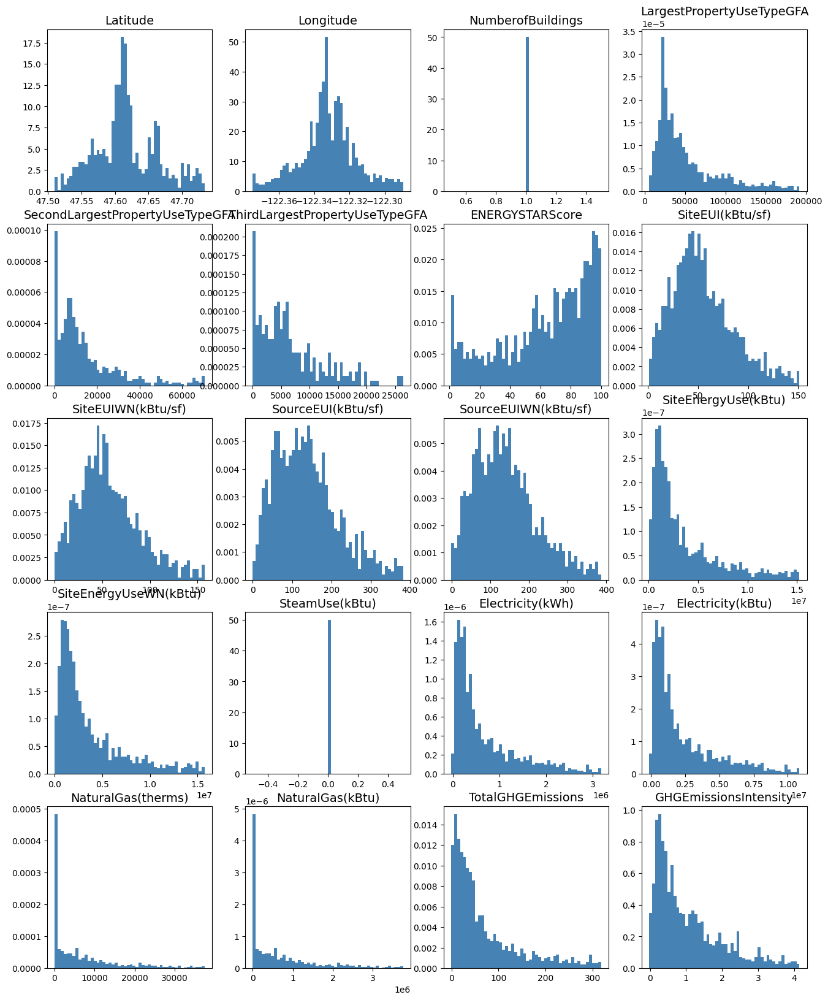

In [28]:
#Visualisation des distributions
fig = plt.figure(figsize=(16, 24))
for feat_idx in range(0,data_X.columns.size):
    ax = fig.add_subplot(6,4, (feat_idx+1))
    h = ax.hist(df26.select_dtypes(include='float64').iloc[:, feat_idx].to_numpy(), bins=50, color='steelblue', density=True, edgecolor='none')
    ax.set_title(df26.select_dtypes(include='float64').columns[feat_idx], fontsize=14)


In [29]:
#On note une valeur unique pour deux variables => on les supprime
df31=df26.drop(columns=['NumberofBuildings','SteamUse(kBtu)'])

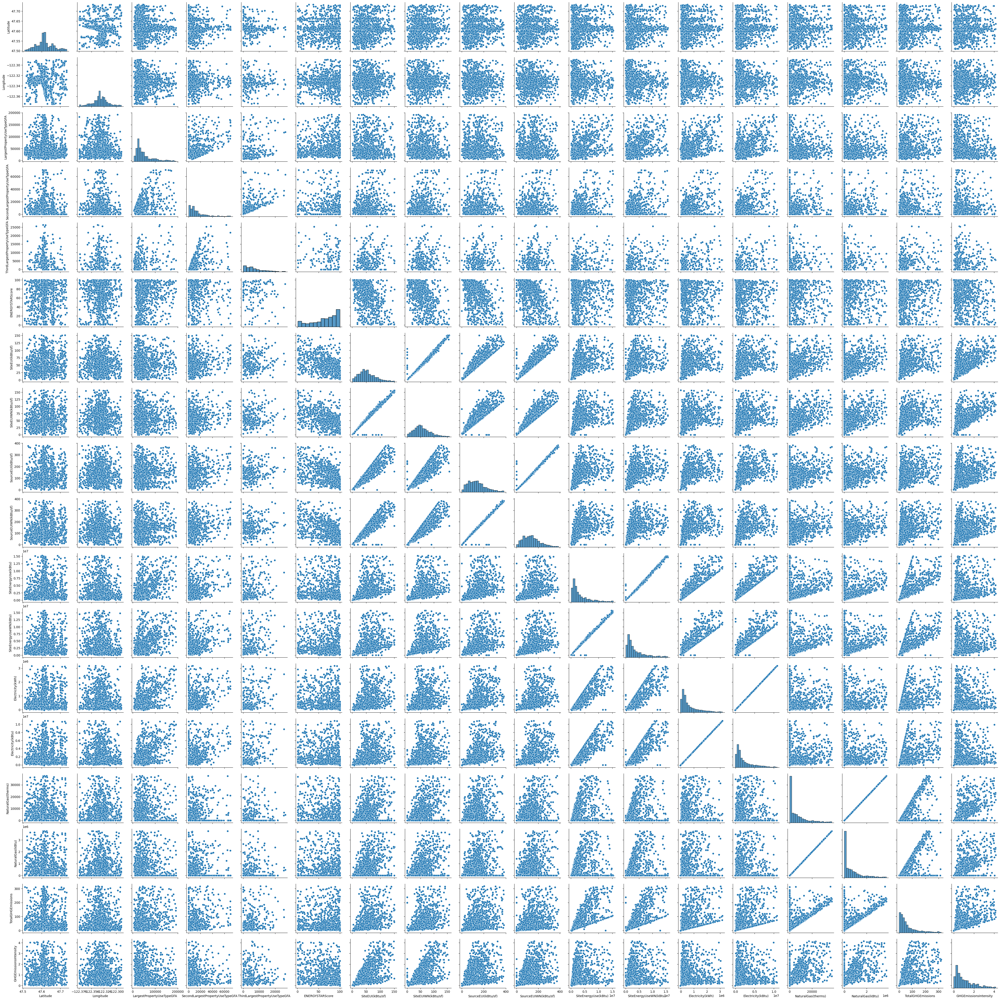

In [30]:
#Visualisation de l'analyse bivariée
sns.pairplot(df31.select_dtypes(include='float64'))

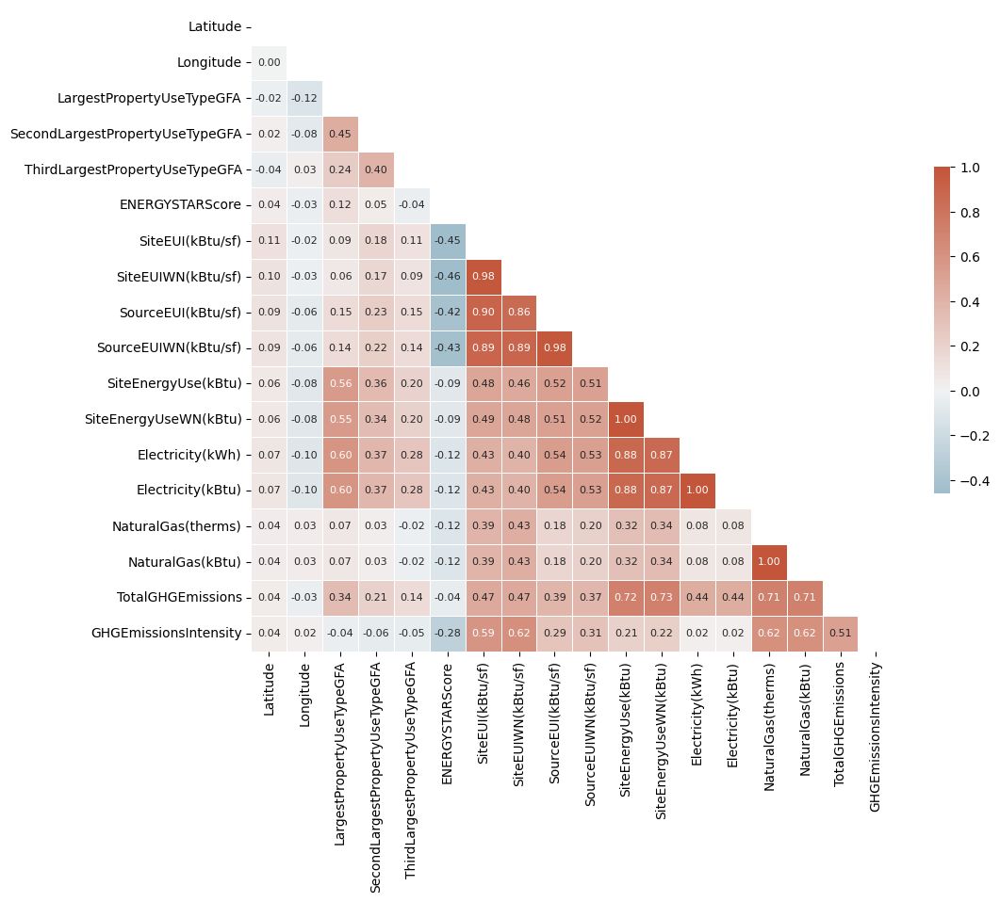

In [31]:
# Compute the correlation matrix
corr = df31.select_dtypes(include='float64').corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True, fmt=".2f", annot_kws={'size':8});

## <a name="C9">3-2 Feature Engineering - Variables numériques</a>

## 3-2-a : Suppression des variables colinéaires

In [32]:
#on trie par paire de variables avec la plus forte corrélation
threshold = 0.7
corr_pairs = corr.unstack().sort_values(kind="quicksort")
strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
32,NaturalGas(therms),NaturalGas(kBtu),1.000000
30,Electricity(kBtu),Electricity(kWh),1.000000
28,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),0.996689
26,SourceEUIWN(kBtu/sf),SourceEUI(kBtu/sf),0.982078
24,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),0.980605
22,SourceEUI(kBtu/sf),SiteEUI(kBtu/sf),0.901777
20,SourceEUIWN(kBtu/sf),SiteEUI(kBtu/sf),0.893992
18,SourceEUIWN(kBtu/sf),SiteEUIWN(kBtu/sf),0.887587
16,SiteEnergyUse(kBtu),Electricity(kWh),0.880249
14,SiteEnergyUse(kBtu),Electricity(kBtu),0.880249


On remarque que l'on a des variables fortement corrélées. elles sont identiques mais avec une unité différente (kBtu vs therms ou kWh). Pour ces variables on conserve celles qui sont en kBtu et on supprime les autres ('Electricity(kWh)','NaturalGas(therms)')

On remarque qu'on a deux types de variables fortement corrélées: SiteEnergyUse et SourceEU qui se déclinent sur 4 modes (WN, kBtu, sf, I). On choisit de conserver celles qui sont en WN(kBtu/sf) pour Source EUI et WN(kBtu) pour SiteEU. ('SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)','SourceEUI(kBtu/sf)') sont supprimées

In [33]:
df32a=df31.drop(columns=['Electricity(kWh)','NaturalGas(therms)','SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)','SourceEUI(kBtu/sf)'])

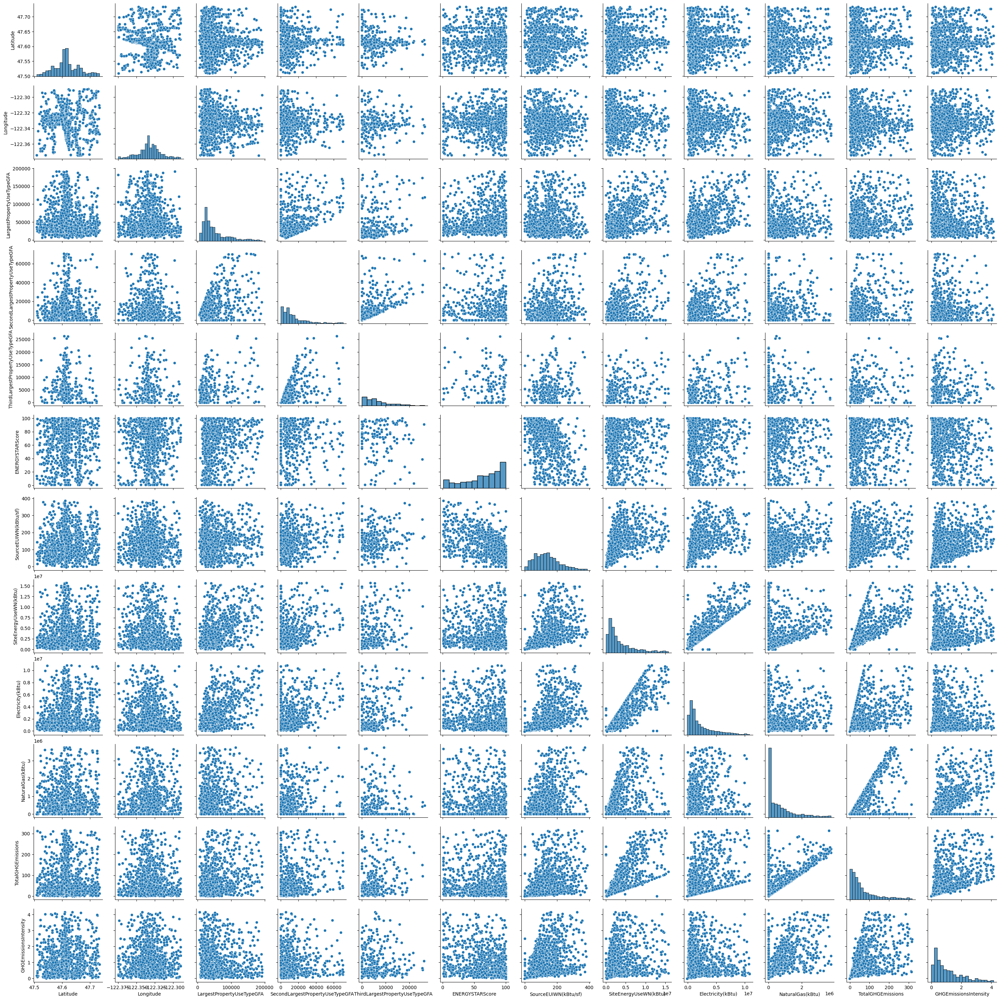

In [34]:
#Visualisation de l'analyse bivariée après suppression des colonnes colinéaires
sns.pairplot(df32a.select_dtypes(include='float64'))

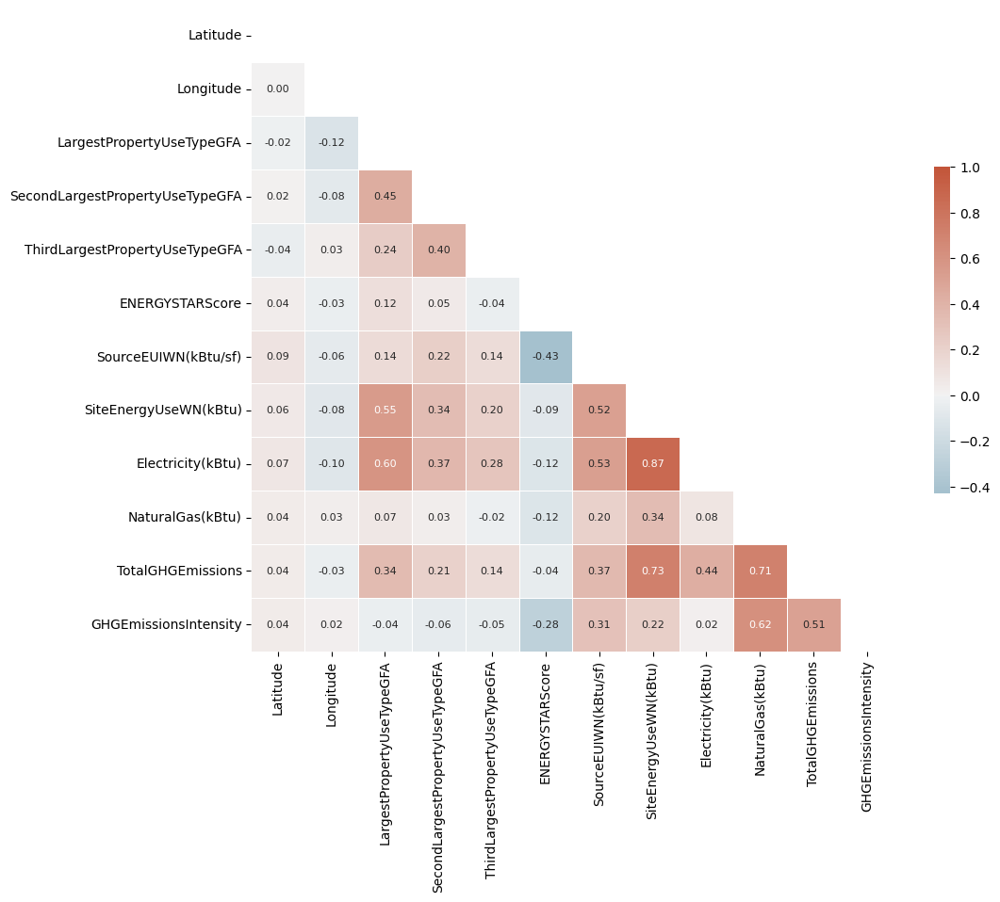

In [35]:
# Compute the correlation matrix
corr = df32a.select_dtypes(include='float64').corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True, fmt=".2f", annot_kws={'size':8});

## 3-2-b Normalisation des données numériques 

On change toutes les colonnes numériques possibles en /sf pour se libérer de la colinéarité avec PropertyGFATotal :
     'PropertyGFAParking',
     'LargestPropertyUseTypeGFA',
     'SecondLargestPropertyUseTypeGFA',
     'ThirdLargestPropertyUseTypeGFA',
     'SiteEnergyUseWN(kBtu)', 
     'Electricity(kBtu)',  
     'NaturalGas(kBtu)',
     'TotalGHGEmissions',
     'GHGEmissionsIntensity']**

In [36]:
df32b=df32a.copy()
df32b.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'ZipCode', 'TaxParcelIdentificationNumber',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUseWN(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)',
       'DefaultData', 'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

In [38]:
#On divise les colonnes concernées par 'PropertyGFATotal'
for i in ['PropertyGFAParking',
          'LargestPropertyUseTypeGFA',
          'SecondLargestPropertyUseTypeGFA',
          'ThirdLargestPropertyUseTypeGFA',
          'SiteEnergyUseWN(kBtu)', 
          'Electricity(kBtu)',  
          'NaturalGas(kBtu)',
          'TotalGHGEmissions',
          'GHGEmissionsIntensity']:
    df32b.loc[df32b.index,i]=(df32b[i]/df32b['PropertyGFATotal']).values

In [39]:
for i in ['PropertyGFAParking',
            'LargestPropertyUseTypeGFA',
            'SecondLargestPropertyUseTypeGFA',
            'ThirdLargestPropertyUseTypeGFA',
            'SiteEnergyUseWN(kBtu)', 
            'Electricity(kBtu)',  
            'NaturalGas(kBtu)',
            'TotalGHGEmissions',
            'GHGEmissionsIntensity']:
    df32b.rename(columns = {i:i+f'/sf'}, inplace = True)
df32b

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,...,ThirdLargestPropertyUseTypeGFA/sf,YearsENERGYSTARCertified,ENERGYSTARScore,SourceEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu)/sf,Electricity(kBtu)/sf,NaturalGas(kBtu)/sf,DefaultData,TotalGHGEmissions/sf,GHGEmissionsIntensity/sf
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,98101.0,0659000030,7,DOWNTOWN,...,NaN,NaN,60.0,189.000000,84.321754,44.621152,14.433962,False,0.002827,0.000032
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,98101.0,0659000220,7,DOWNTOWN,...,0.044629,NaN,61.0,179.399994,83.661424,31.311927,NaN,False,0.002857,0.000028
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,98101.0,0659000475,7,DOWNTOWN,...,NaN,NaN,43.0,244.100006,NaN,NaN,1.562373,False,NaN,0.000002
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,98101.0,0659000640,7,DOWNTOWN,...,NaN,NaN,56.0,224.000000,113.287679,45.155316,29.537068,False,0.004671,NaN
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,98121.0,0659000970,7,DOWNTOWN,...,0.000000,NaN,75.0,215.600006,83.474786,30.576415,NaN,False,NaN,0.000016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3368,50219,2016,Nonresidential COS,Mixed Use Property,Garfield Community Center,2323 East Cherry St,NaN,7544800245,3,CENTRAL,...,0.188479,NaN,NaN,184.600006,99.408310,38.376712,52.067385,False,0.003033,0.000151
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,NaN,2524039059,1,DELRIDGE NEIGHBORHOODS,...,NaN,NaN,NaN,136.600006,56.154215,34.629101,16.413121,False,0.001113,0.000061
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,...,0.000000,NaN,NaN,NaN,460.117390,136.213328,NaN,False,0.016990,NaN
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,NaN,7883603155,1,GREATER DUWAMISH,...,0.034324,NaN,NaN,110.800003,55.516723,24.740811,26.281895,False,0.001568,0.000111


## 3-2-c Suppression de variables

In [60]:
#On trie les variables par ordre de remplissage
df32c=df32b.copy()
df32c.isna().mean().sort_values(ascending=False)

YearsENERGYSTARCertified              0.936864
ThirdLargestPropertyUseTypeGFA/sf     0.794976
ThirdLargestPropertyUseType           0.770536
SecondLargestPropertyUseTypeGFA/sf    0.528853
SecondLargestPropertyUseType          0.450781
ENERGYSTARScore                       0.355737
Electricity(kBtu)/sf                  0.125594
SiteEnergyUseWN(kBtu)/sf              0.119484
NaturalGas(kBtu)/sf                   0.114732
TotalGHGEmissions/sf                  0.114053
Longitude                             0.109980
LargestPropertyUseTypeGFA/sf          0.107264
SourceEUIWN(kBtu/sf)                  0.090292
GHGEmissionsIntensity/sf              0.088934
ZipCode                               0.007468
LargestPropertyUseType                0.002716
DefaultData                           0.000000
OSEBuildingID                         0.000000
ListOfAllPropertyUseTypes             0.000000
DataYear                              0.000000
PropertyGFAParking/sf                 0.000000
PropertyGFATo

In [61]:
#On vérifie le noùmbre de valeurs uniques par colonne
df32c.nunique().sort_values()

DataYear                                 1
DefaultData                              1
BuildingType                             5
CouncilDistrictCode                      7
Neighborhood                            14
PrimaryPropertyType                     21
ThirdLargestPropertyUseType             38
NumberofFloors                          45
SecondLargestPropertyUseType            46
ZipCode                                 48
LargestPropertyUseType                  55
YearsENERGYSTARCertified                63
ENERGYSTARScore                        100
YearBuilt                              113
ThirdLargestPropertyUseTypeGFA/sf      278
PropertyGFAParking/sf                  320
ListOfAllPropertyUseTypes              359
SecondLargestPropertyUseTypeGFA/sf     608
LargestPropertyUseTypeGFA/sf           871
NaturalGas(kBtu)/sf                    885
SourceEUIWN(kBtu/sf)                  1061
Longitude                             1144
Electricity(kBtu)/sf                  1287
SiteEnergyU

In [62]:
#On supprime les variables à valeur unique ou celles qui on des valeurs inutiles pour l'analyse 
df32c=df32c.drop(columns=['OSEBuildingID',
                          'Address',
                          'PropertyName',
                          'TaxParcelIdentificationNumber',
                          'DataYear',
                          'DefaultData',
                          'ListOfAllPropertyUseTypes',
                          'SecondLargestPropertyUseType', 
                          'SecondLargestPropertyUseTypeGFA/sf',
                          'ThirdLargestPropertyUseType', 
                          'ThirdLargestPropertyUseTypeGFA/sf',
                          'YearsENERGYSTARCertified', 
                          'ENERGYSTARScore', ])

In [63]:
df32c.shape

(1473, 20)

In [64]:
df32c.columns


Index(['BuildingType', 'PrimaryPropertyType', 'ZipCode', 'CouncilDistrictCode',
       'Neighborhood', 'Latitude', 'Longitude', 'YearBuilt', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking/sf', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA/sf',
       'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)/sf',
       'Electricity(kBtu)/sf', 'NaturalGas(kBtu)/sf', 'TotalGHGEmissions/sf',
       'GHGEmissionsIntensity/sf'],
      dtype='object')

## 3-2-d Imputation des colonnes

La colonne longitude a 11% de cellules vides alors que la colonne latitude est à 100% remplie. On a vu lors de l'analyse bivariée que la colonne longitude était très peu corrélée aux autres variables, notamment nos targets. On choisit donc d'imputer la médiane aux cellules vides de cette colonne.

In [65]:
df32d=df32c.copy()
med=df32d['Longitude'].median()

In [66]:
df32d['Longitude']=df32d['Longitude'].fillna(med)

## 3-2-e : Bilan

On supprime maintenant toutes les lignes vides pour conserver une base remplie à 100%

In [67]:
df32e=df32d.dropna(axis='rows',how='any')

<AxesSubplot: >

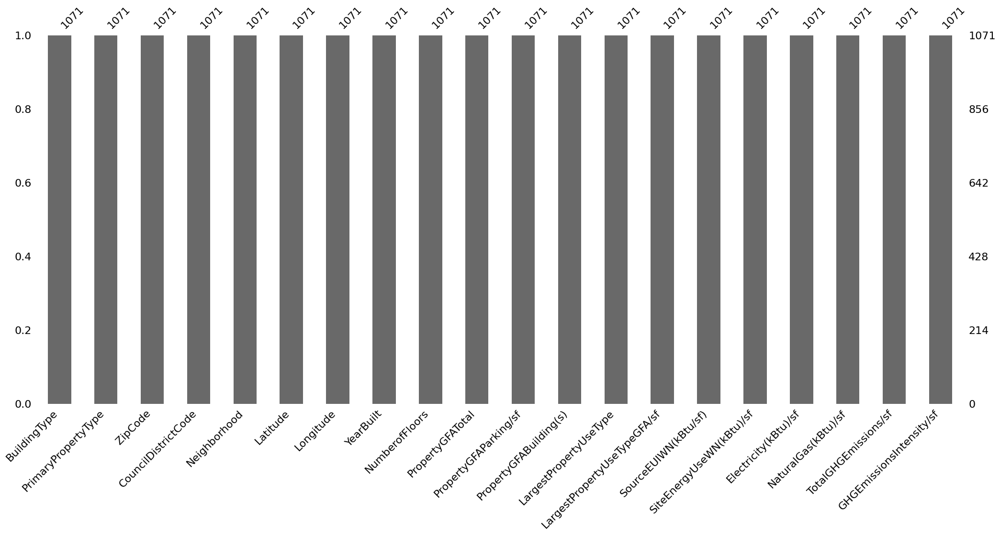

In [68]:
msno.bar(df32e)

## <a name="C10">3-3 : Feature Engineering - Variables catégorielles</a>

In [69]:
df33=df32e.copy()

In [70]:
[i for i in df33.columns if df33[i].dtype=='object']

['BuildingType',
 'PrimaryPropertyType',
 'ZipCode',
 'Neighborhood',
 'LargestPropertyUseType']

In [72]:
#on targetencode les colonnes catégorielles
Target = 'TotalGHGEmissions/sf'
encoder = TargetEncoder()
for i in [i for i in df33.columns if df33[i].dtype=='object']:
    df33[i] = encoder.fit_transform(df33[i], df33[Target])

In [73]:
df33.shape

(1071, 20)

In [74]:
df33.to_csv('df33.csv',index=False)

## <a name="C11">Annexes</a>

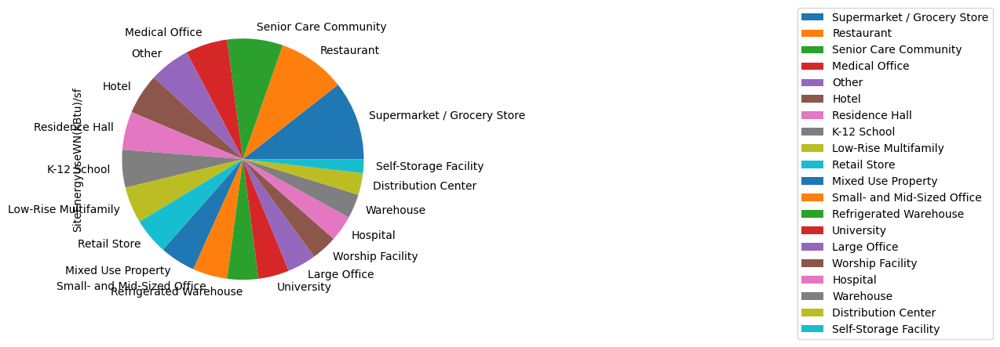

In [76]:
#découpage de la consommation d'énergie/sf par type de building
df=pd.DataFrame()
df['PrimaryPropertyType']=df32e['PrimaryPropertyType']
df['SiteEnergyUseWN(kBtu)/sf']=df32e['SiteEnergyUseWN(kBtu)/sf']
df=pd.DataFrame(df)
df=df.groupby(by=['PrimaryPropertyType']).agg('mean').reset_index(drop=False)
df.index=df['PrimaryPropertyType']
df.sort_values('SiteEnergyUseWN(kBtu)/sf',ascending=False,inplace=True)

plot = df.plot.pie(y='SiteEnergyUseWN(kBtu)/sf', figsize=(5, 5))
plt.legend(bbox_to_anchor=(3,1.02))
plt.show()

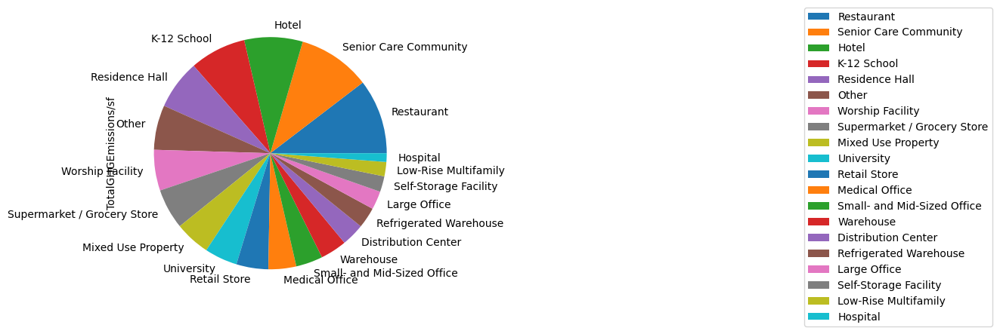

In [77]:
#découpage des émissions carbone/sf par type de building
df=pd.DataFrame()
df['PrimaryPropertyType']=df32e['PrimaryPropertyType']
df['TotalGHGEmissions/sf']=df32e['TotalGHGEmissions/sf']
df=pd.DataFrame(df)
df=df.groupby(by=['PrimaryPropertyType']).agg('mean').reset_index(drop=False)
df.index=df['PrimaryPropertyType']
df.sort_values('TotalGHGEmissions/sf',ascending=False,inplace=True)

plot = df.plot.pie(y='TotalGHGEmissions/sf', figsize=(5, 5))
plt.legend(bbox_to_anchor=(3,1.02))
plt.show()